In [ ]:
!pip install lime
!pip install transformers
!pip install -U spacy
!python -m spacy download pt_core_news_lg
# !python -m spacy download pt_core_news_sm

In [1]:
# for data
import json
import pandas as pd
import numpy as np

# for visualize data
import matplotlib.pyplot as plt
import seaborn as sns

# for processing
import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

# for bag-of-words
from sklearn import feature_selection, feature_extraction, model_selection, naive_bayes, pipeline, manifold, preprocessing, metrics

# for explainer
from lime import lime_text

# for words embedding
import gensim
import gensim.downloader as gensim_api

# for deep learning
from tensorflow.keras import models, layers, preprocessing as kprocessing
from tensorflow.keras import backend as k

import re
import string

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


#### loading data

In [2]:
raw_data = pd.read_csv('https://raw.githubusercontent.com/omathiasschulz/fake-news-dataset/master/datasets/unformatted/dataset.csv', index_col=[0])

raw_data = raw_data.drop(['ID', 'author', 'category', 'average_word_length', 'date_publication', 'link', 'percent_speeling_errors'], axis=1)
raw_data = raw_data.rename({'fake_news': 'label'}, axis=1)
raw_data = raw_data.sample(frac=1)

raw_data.head(10)

,label,text
4666,0,Maia diz que Meirelles deveria apresentar agen...
4550,0,Coreia do Norte e China confirmam visita de Ki...
1463,1,Ação da PF confirmou que o brasileiro consome ...
5060,0,"Citado na Carne Fraca, Serraglio chefiará comb..."
4473,0,MPF apura se disciplina Golpe de 2016 da UFG t...
4751,0,"Segunda-feira, 11 de setembro de 2017. Boa noi..."
2525,1,"Senador faz denúncia grave: ""Lula e Dilma tent..."
499,1,"Enéas em 1997: ""FHC vendeu a Vale do Rio Doce ..."
1914,1,Governo Temer entra em rota de colisão com o p...
3074,1,Na Câmara e no Senado já se fala que as Forças...


#### Pre processamento dos textos

https://realpython.com/natural-language-processing-spacy-python/

In [6]:
import spacy

# vamos configurar o spacy para o pacote portugues
nlp = spacy.load("pt_core_news_lg")

#nlp = spacy.load("pt_core_news_sm")

In [4]:
# vamos criar uma função que irá realizar o tratamento do texto

def process_text(text):
  # remocao de caracteres especiais e transformando o texto em minusculo
  text = re.sub(r'[^\w\s]', '', str(text).lower().strip())

  # aplicando a biblioca spicy para lematizacao do texto
  lst_text = ' '.join([i.lemma_ for i in nlp(text) if not i.is_punct and not i.is_stop])

  return lst_text

In [5]:
# vamos criar uma cópia do nosso dataset e aplicar o processamento de texto
dtf = raw_data.copy()

dtf['text_cleaned']  = raw_data.text.apply(process_text)
dtf.head()

,label,text,text_cleaned
4666,0,Maia diz que Meirelles deveria apresentar agen...,Maia Meirelles dever apresentar agenda pósrefo...
4550,0,Coreia do Norte e China confirmam visita de Ki...,coreia norte china confirmar visita Kim jongun...
1463,1,Ação da PF confirmou que o brasileiro consome ...,ação pf confirmar brasileiro consumir carne po...
5060,0,"Citado na Carne Fraca, Serraglio chefiará comb...",citar carne fraco serraglio chefiar combate co...
4473,0,MPF apura se disciplina Golpe de 2016 da UFG t...,mpf apurar disciplina golpe 2016 ufg caráter P...


In [8]:
dtf['n_words'] = dtf.text_cleaned.apply(lambda x: len(x.split()))
dtf['n_letters'] = dtf.text_cleaned.apply(lambda x: len(x))

mean_n_words = int(dtf.n_words.mean())
mean_n_letters = int(dtf.n_letters.mean())
max_words = int(dtf.n_words.sum())

print(f'Média de palavras em cada texto: {mean_n_words}')
print(f'Total de palavras no corpus: {max_words}')

Média de palavras em cada texto: 327
Total de palavras no corpus: 2356599


In [48]:
# Vamos renomear a coluna label para y e divir os dados para treino e teste.
dtf['label'] = dtf.label.apply(lambda x: np.int8(x))

## split dataset
dtf_train, dtf_test = model_selection.train_test_split(dtf, test_size=0.3)
dtf_test, dtf_val = model_selection.train_test_split(dtf_test, test_size=0.3)

## get target
y_train = dtf_train["label"].values
y_test = dtf_test["label"].values
y_val = dtf_test["label"].values

## Método "Bolsa de Palavras"

O método bolsa de palavras consiste em construírmos um vocabulário a partir de um conjunto de documentos e contar quantas vezes cada palavra aparece em cada documento. 

Em termos gerais, cada palavra no vocabulário se torna um atributo e o documento é representado por um vetor de tamanho igual ao do vocabulário - daí o nome 'bolsa de palavras' -. 

In [10]:
## Tf-Idf (advanced variant of BoW)
vectorizer = feature_extraction.text.TfidfVectorizer(max_features=max_words, ngram_range=(1,2))

In [25]:
corpus = dtf_train["text_cleaned"]

vectorizer.fit(corpus)
dic_vocabulary = vectorizer.vocabulary_

x_train = vectorizer.transform(corpus)

In [91]:
y = dtf_train['label']
x_names = vectorizer.get_feature_names_out()
p_value_limit = 0.9

dtf_features = pd.DataFrame()

for cat in np.unique(y):
    chi2, p = feature_selection.chi2(x_train, y==cat)
    dtf_features = dtf_features.append(pd.DataFrame(
                   {"feature":x_names, "score":1-p, "label":cat}))
    dtf_features = dtf_features.sort_values(["label","score"], 
                    ascending=[True,False])
    dtf_features = dtf_features[dtf_features["score"]>p_value_limit]
    
x_names = dtf_features["feature"].unique().tolist()

In [92]:
for cat in np.unique(y):
   print("# {}:".format(cat))
   print("  . selected features:",
         len(dtf_features.loc[dtf_features["label"]==cat]))
   print("  . top features:", ",".join(
dtf_features.loc[dtf_features["label"]==cat]["feature"].values[-10:]))
   print(" ")

# 0:
  . selected features: 342
  . top features: temer,corrupção,república,oas,empresário,deixar,fazer,investigar,silva,2015
 
# 1:
  . selected features: 342
  . top features: temer,corrupção,república,oas,empresário,deixar,fazer,investigar,silva,2015
 


In [49]:
# Podemos retreinar o vetorizador com o corpus do documento após a selecao dos melhores atributos.
# esta saida ira produzir a matriz e o vocabulario menos denso

vectorizer = feature_extraction.text.TfidfVectorizer(vocabulary=x_names)

vectorizer.fit(corpus)
dic_vocabulary = vectorizer.vocabulary_

x_train = vectorizer.transform(dtf_train['text_cleaned'])
x_test = vectorizer.transform(dtf_test['text_cleaned'])

#### Modelo Base

In [31]:
classifier = naive_bayes.MultinomialNB()

In [51]:
## pipeline
base_model = pipeline.Pipeline([("vectorizer", vectorizer),  
                           ("classifier", classifier)])

## train classifier
base_model["classifier"].fit(x_train, y_train)

MultinomialNB()

In [52]:
## test
x_test = dtf_test["text_cleaned"].values

predicted = base_model.predict(x_test)
predicted_prob = base_model.predict_proba(x_test)

Accuracy: 0.8
Detail:
              precision    recall  f1-score   support

           0       0.75      0.91      0.82       761
           1       0.88      0.69      0.77       751

    accuracy                           0.80      1512
   macro avg       0.82      0.80      0.80      1512
weighted avg       0.81      0.80      0.80      1512


Detail:


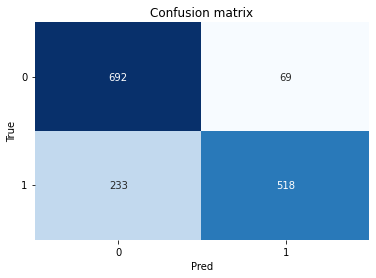

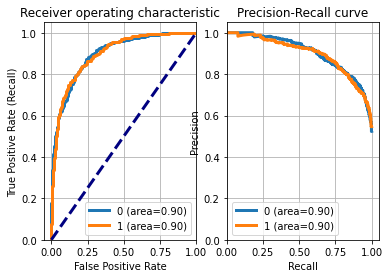

In [90]:
classes = np.unique(y_test)
y_test_array = pd.get_dummies(y_test, drop_first=False).values

# ## Accuracy, Precision, Recall
accuracy = metrics.accuracy_score(y_test, predicted)

print("Accuracy:",  round(accuracy,2))
print("Detail:")
print(metrics.classification_report(y_test, predicted))
    
## Plot confusion matrix
cm = metrics.confusion_matrix(y_test, predicted)
fig, ax = plt.subplots()
sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")

print()
plt.yticks(rotation=0)
fig, ax = plt.subplots(nrows=1, ncols=2)

## Plot roc
for i in range(len(classes)):
    fpr, tpr, thresholds = metrics.roc_curve(y_test_array[:,i],  
                           predicted_prob[:,i])
    ax[0].plot(fpr, tpr, lw=3, 
              label='{0} (area={1:0.2f})'.format(classes[i], 
                              metrics.auc(fpr, tpr))
               )
ax[0].plot([0,1], [0,1], color='navy', lw=3, linestyle='--')
ax[0].set(xlim=[-0.05,1.0], ylim=[0.0,1.05], 
          xlabel='False Positive Rate', 
          ylabel="True Positive Rate (Recall)", 
          title="Receiver operating characteristic")
ax[0].legend(loc="lower right")
ax[0].grid(True)
print("Detail:")

    
## Plot precision-recall curve
for i in range(len(classes)):
    precision, recall, thresholds = metrics.precision_recall_curve(
                 y_test_array[:,i], predicted_prob[:,i])
    ax[1].plot(recall, precision, lw=3, 
               label='{0} (area={1:0.2f})'.format(classes[i], 
                                  metrics.auc(recall, precision))
              )
ax[1].set(xlim=[0.0,1.05], ylim=[0.0,1.05], xlabel='Recall', 
          ylabel="Precision", title="Precision-Recall curve")
ax[1].legend(loc="best")
ax[1].grid(True)
plt.show()

In [68]:
## select observation
i = np.random.randint(0, dtf_test.shape[0])
txt_instance = dtf_test["text"].iloc[i]

## check true value and predicted value
print("True:", y_test[i], "--> Pred:", predicted[i], "| Prob:", round(np.max(predicted_prob[i]),2))

## show explanation
explainer = lime_text.LimeTextExplainer(class_names=
             np.unique(y_train))
explained = explainer.explain_instance(txt_instance, 
             base_model.predict_proba, num_features=3)
explained.show_in_notebook(text=txt_instance, predict_proba=False)

True: 1 --> Pred: 1 | Prob: 0.8


In [69]:
for _ in range(3):
  ## select observation
  i = np.random.randint(0, dtf_test.shape[0])
  txt_instance = dtf_test["text"].iloc[i]

  ## check true value and predicted value
  print("True:", y_test[i], "--> Pred:", predicted[i], "| Prob:", round(np.max(predicted_prob[i]),2))

  ## show explanation
  explainer = lime_text.LimeTextExplainer(class_names=
              np.unique(y_train))
  explained = explainer.explain_instance(txt_instance, 
              base_model.predict_proba, num_features=3)
  explained.show_in_notebook(text=txt_instance, predict_proba=False)

True: 0 --> Pred: 0 | Prob: 0.66


True: 1 --> Pred: 0 | Prob: 0.51


True: 0 --> Pred: 1 | Prob: 0.65


#### Linear Model

In [71]:
import tensorflow as tf

batch_size = 32

raw_train_ds = tf.data.Dataset.from_tensor_slices((dtf_train.text_cleaned.values, dtf_train.label.values))
raw_test_ds = tf.data.Dataset.from_tensor_slices((dtf_test.text_cleaned.values, dtf_test.label.values))
raw_val_ds = tf.data.Dataset.from_tensor_slices((dtf_val.text_cleaned.values, dtf_val.label.values))

raw_train_ds = raw_train_ds.batch(batch_size)
raw_test_ds = raw_test_ds.batch(batch_size)
raw_val_ds = raw_val_ds.batch(batch_size)


AUTOTUNE = tf.data.AUTOTUNE

def configure_dataset(dataset):
  return dataset.cache().prefetch(buffer_size=AUTOTUNE)

train_ds = configure_dataset(raw_train_ds)
test_ds = configure_dataset(raw_test_ds)
raw_ds = configure_dataset(raw_val_ds)

In [72]:
# vamos criar uma camada de vetorização com o nosso vocabulario ja criado

vectorize_layer = tf.keras.layers.TextVectorization(
    max_tokens=int(len(dic_vocabulary) + 1),
    output_mode='tf-idf',
    idf_weights=vectorizer.idf_,
    vocabulary=list(dic_vocabulary.keys())
)

In [73]:
# function to print result
def vectorize_text(text, label):
  text = tf.expand_dims(text, -1)
  return vectorize_layer(text), label

In [74]:
# Retrieve a batch (of 32 reviews and labels) from the dataset.
text_batch, label_batch = next(iter(raw_train_ds))
first_question, first_label = text_batch[0], label_batch[0]

print("Question", first_question)
print("Label", first_label)
print()
print("'binary' vectorized question:", vectorize_text(first_question, first_label)[0])

Question tf.Tensor(b'dilma tirar sarro brasileiro ser ministro popozudar tiririca beiramar vergonha anunciar pal\xc3\xa1cio planalto anunciar investigar lula ministro ser cartada governo dilma petista comemorar posse Lula ministro chefe casa civil ocorrer ter\xc3\xa7afeira presidente partido petralhar pt chamar lula futuro ministro Esperan\xc3\xa7a Esperan\xc3\xa7a esperan\xc3\xa7a pra lula evitar prender garra S\xc3\xa9rgio moro seguir racioc\xc3\xadnio nomea\xc3\xa7\xc3\xa3o Lula poder refletir imaginar ser asneira cometer dilma fernandinho beiramar minist\xc3\xa9rio justi\xc3\xa7a tiririco ministro Educa\xc3\xa7\xc3\xa3o A\xc3\xa9cio Neves ministro avia\xc3\xa7\xc3\xa3o valeska popozud ministra cultura aguardar pra', shape=(), dtype=string)
Label tf.Tensor(1, shape=(), dtype=int8)

'binary' vectorized question: tf.Tensor(
[[177.019       7.6136084   0.          0.          0.          0.
    0.          0.          0.          0.          0.          0.
    0.          0.          0

In [75]:
# encoding all datasets

train_ds = raw_train_ds.map(vectorize_text)
test_ds = raw_test_ds.map(vectorize_text)

In [76]:
# esta função irá nos ajudar a reproduzir os resultados do modelo

def plot_accuracy(history):
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()

def plot_loss(history):
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()


Epoch 1/10
158/158 [==============================] - 2s 8ms/step - loss: 4.4379 - accuracy: 0.5042 - val_loss: 0.9338 - val_accuracy: 0.5866
Epoch 2/10
158/158 [==============================] - 1s 7ms/step - loss: 0.6378 - accuracy: 0.7139 - val_loss: 0.4505 - val_accuracy: 0.8016
Epoch 3/10
158/158 [==============================] - 1s 7ms/step - loss: 0.3650 - accuracy: 0.8466 - val_loss: 0.3462 - val_accuracy: 0.8591
Epoch 4/10
158/158 [==============================] - 1s 7ms/step - loss: 0.2832 - accuracy: 0.8901 - val_loss: 0.2941 - val_accuracy: 0.8862
Epoch 5/10
158/158 [==============================] - 1s 6ms/step - loss: 0.2382 - accuracy: 0.9151 - val_loss: 0.2659 - val_accuracy: 0.8988
Epoch 6/10
158/158 [==============================] - 1s 6ms/step - loss: 0.2115 - accuracy: 0.9288 - val_loss: 0.2528 - val_accuracy: 0.9101
Epoch 7/10
158/158 [==============================] - 1s 6ms/step - loss: 0.1933 - accuracy: 0.9393 - val_loss: 0.2467 - val_accuracy: 0.9200
Epoch 

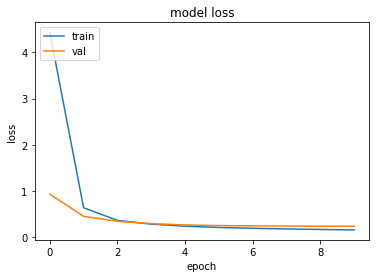

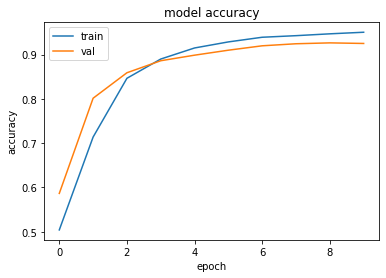

In [77]:
from tensorflow.keras import losses

linear_model = tf.keras.Sequential([layers.Dense(2)])

linear_model.compile(
    loss=losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer='adam',
    metrics=['accuracy'])

history = linear_model.fit(
    train_ds, validation_data=test_ds, epochs=10)

plot_loss(history)
plot_accuracy(history)

In [78]:
print("Linear model on binary vectorized data:")
print(linear_model.summary())

Linear model on binary vectorized data:
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 2)                 730       
                                                                 
Total params: 730
Trainable params: 730
Non-trainable params: 0
_________________________________________________________________
None


In [79]:
loss, accuracy = linear_model.evaluate(test_ds)

print("Binary model accuracy: {:2.2%}".format(accuracy))
print("Binary model loss: {:2.2%}".format(loss))

48/48 [==============================] - 0s 4ms/step - loss: 0.2380 - accuracy: 0.9253
Binary model accuracy: 92.53%
Binary model loss: 23.80%


In [80]:
export_model = tf.keras.Sequential(
    [vectorize_layer, linear_model,
     layers.Activation('softmax')])

export_model.compile(
    loss=losses.SparseCategoricalCrossentropy(from_logits=False),
    optimizer='adam',
    metrics=['accuracy'])

# Test it with `raw_test_ds`, which yields raw strings
loss, accuracy = export_model.evaluate(raw_test_ds)
print("Accuracy: {:2.2%}".format(accuracy))

48/48 [==============================] - 1s 5ms/step - loss: 0.2380 - accuracy: 0.9253
Accuracy: 92.53%


In [85]:
random = np.random.randint(0, dtf.shape[0])
random_raw_text = dtf.text[random]
print()
print(f"Alvo verdadeiro: {dtf.label[random]} | Notícia: {random_raw_text}")
print()
# del input
input = input()
input_processed = process_text(input)

predicted_scores = export_model.predict([input_processed])
predicted_labels = tf.argmax(predicted_scores, axis=1)


print()
print(f"Numero de palavras no texto: {len(input.split())}")
print(f"Numero de palavras entendidas pelo programa: {len(input_processed.split())}")
print(f'Texto processado: {input_processed}')
print()
print('Analizando....')

print(f"Esta notícia parece ser {'falsa' if [i.round(2) for i in predicted_scores[0]][1] >= 0.7 else 'verdadeira'}! | Probabilidade: {round(np.max(predicted_scores), 2)}")
print()
# print([i.round(2) for i in predicted_scores[0]])

## show explanation
explainer = lime_text.LimeTextExplainer(class_names=
             np.unique(dtf.label.unique()))
explained = explainer.explain_instance(input_processed, 
             export_model.predict, num_features=3)
explained.show_in_notebook(text=input_processed, predict_proba=False)

del input


Alvo verdadeiro: 1 | Notícia: ONU alerta: "A Coreia será incinerada em questão de horas. Contagem de corpos será de dezenas de milhões". . "A Coréia do Norte pode ser literalmente "incinerada" e o número de mortos pode chegar a dezenas de milhões" , alertou. Hallam disse que há preocupações de que Donald Trump tome a iniciativa e ataque as instalações de testes nucleares da Coréia do Norte, o que teria conseqüências devastadoras. "Qualquer ação de bombardeio direto contra a Coréia do Norte deve ser evitada [...] A RPDC ( República Democrática Popular da Coréia ) não tem condições de vencer um conflito com os EUA  embora acredito que poderia ser um confronto nivelado até certo tempo" , disse ele ao site news.com.au. O especialista destacou que, se Kim Jon-un lançar seus mísseis nucleares de forma exitosa e precisa, diferentemente de explodi-los no lançamento, as ogivas seriam do tamanho das bombas de Hiroshima: "Os EUA dificilmente serão atingidos (os americanos têm tecnologia para in

In [86]:
## select observation
random = np.random.randint(0, dtf.shape[0])
random_raw_text = dtf.text[random]

input_processed = process_text(random_raw_text)
predicted_scores = export_model.predict([input_processed])

## check true value and predicted value
print(f"Alvo verdadeiro: {dtf.label[random]} | Notícia: {input_processed}")
print("True:", dtf.label[random], "--> Pred:", 0 if predicted_scores[0][1] <= 0.7 else 1, "| Prob:", round(np.max(predicted_scores[0]), 2))

## show explanation
explainer = lime_text.LimeTextExplainer(class_names=
             np.unique(dtf.label.unique()))
explained = explainer.explain_instance(input_processed, 
             export_model.predict, num_features=3)
explained.show_in_notebook(text=input_processed, predict_proba=False)
print(f"Esta notícia parece ser {'falsa' if [i.round(2) for i in predicted_scores[0]][1] >= 0.7 else 'verdadeira'}!")


Alvo verdadeiro: 0 | Notícia: lava jato resultado eleição presidência incerto último ano esperar eleição ano difícil responder pergunta 1989 brasileiro voltar votar presidente último disputa dominar polarização pt psdb tucano vencer primeira Fernando Henrique Cardoso petista faturar seguinte Lula dilma rousseff cara coroa distante repetir principal motivo lava jato chacoalhar político lançar nuvem incerteza futuro partido expresidente Lula liderar pesquisa folga candidato pt futuro começar decidir dia 24 tribunal regional federal julgar caso tríplex psdb problema seca voto governador Geraldo Alckmin enfrentar divisão aliado amarga modesto datafolha senador Aécio Neves esperar virar ano favorito triturar grampo jbs principal beneficiário crise tucano deputado Jair bolsonaro discurso radical tirar ultradireita armário isolar sondagem candidatura ter fôlego excapitão vestir farda partido nanico precisar enfrentar contraditório ausente palanque rede social urna eletrônico incluir nome Mari

Esta notícia parece ser verdadeira!


In [87]:
import tensorflowjs as tfjs

tfjs.converters.save_keras_model(export_model, '/content/drive/MyDrive/Mentorama/projeto_final/js/linear/')

In [ ]:
!pip install tensorflowjs

  Attempting uninstall: packaging
    Found existing installation: packaging 21.3
    Uninstalling packaging-21.3:
      Successfully uninstalled packaging-21.3


In [88]:
from joblib import dump, load

dump(export_model, '/content/drive/MyDrive/Mentorama/projeto_final/fake-detector_v2.joblib')

['/content/drive/MyDrive/Mentorama/projeto_final/fake-detector_v2.joblib']

## Vamos tentar uma outra abordagem:

- vamos dividir o texto em sentenças para melhorar a busca por palavras que classifiquem melhor nossos textos

In [ ]:
# primeiro vamos dar uma olhada novamente nos nossos dados brutos
raw_data.head()

,label,text
2510,1,Pastor que destruiu a vida de Bianca Toledo es...
5256,0,"Não é hora de falar nada, diz Janot sobre dela..."
5626,0,Marco Aurélio Mello decide levar ao plenário d...
4316,0,EUA e Coreia do Sul fazem exercícios militares...
467,1,"Com medo de ser deposto do poder, Temer exoner..."


In [ ]:
# uma vez que vamos utilizar a biblioteca spicy para produzir as sentencas tratadas, vamos aplicar novamente o tratamento de texto.

# vamos copiar o dataset
raw_ds = raw_data.copy()

raw_ds.shape

(7200, 2)

In [ ]:
# vamos mapear as sentencas e explodi-las em um novo dataframe

raw_ds['sentences'] = raw_ds.text.apply(lambda x: [sentence for sentence in nlp(x).sents])

new_ds = raw_ds.explode('sentences')

new_ds = new_ds.reset_index()
new_ds = new_ds.drop(['index'], axis=1)

new_ds.head()

In [ ]:
# agora vamos verificar qual a media de palavras em cada sentença

new_ds.sentences.apply(lambda x: len(str(x).split())).describe()

count    252149.000000
mean         18.389853
std          12.269427
min           1.000000
25%          10.000000
50%          16.000000
75%          25.000000
max         244.000000
Name: sentences, dtype: float64

In [ ]:
# vamos assumar que a menor quantidade de palavras para uma sentença válida seja a partir do primeiro quartil

min_words = 10

print(f'Quantidade de sentenças antes: {new_ds.shape[0]}')

new_ds['n_words'] = new_ds.sentences.apply(lambda x: len(str(x).split()))

new_ds = new_ds.loc[new_ds.n_words >= min_words]

print(f'Quantidade após: {new_ds.shape[0]}')
new_ds.head()


Quantidade de sentenças antes: 189320
Quantidade após: 189320


,label,text,tokens,sentences,n_words
2510,1,Pastor que destruiu a vida de Bianca Toledo es...,pastor destruir vida bianca toledo solto relig...,"(Pastor, que, destruiu, a, vida, de, Bianca, T...",10
2510,1,Pastor que destruiu a vida de Bianca Toledo es...,pastor destruir vida bianca toledo solto relig...,"("", Ninguém, pode, imaginar, o, que, meu, filh...",20
2510,1,Pastor que destruiu a vida de Bianca Toledo es...,pastor destruir vida bianca toledo solto relig...,"(Estou, tão, perplexa, quanto, vocês, "", ,, de...",13
2510,1,Pastor que destruiu a vida de Bianca Toledo es...,pastor destruir vida bianca toledo solto relig...,"(A, religiosa, disse, ainda, que, está, começa...",22
2510,1,Pastor que destruiu a vida de Bianca Toledo es...,pastor destruir vida bianca toledo solto relig...,"("", Nunca, citei, o, nome, do, meu, filho, ,, ...",13


In [ ]:
# vamos aplicar a funcao de processamento de texto definido anteriormente

new_ds['text_cleaned'] = new_ds.sentences.apply(process_text)
new_ds.head()

,label,text,tokens,sentences,n_words,text_cleaned
0,1,Pastor que destruiu a vida de Bianca Toledo es...,pastor destruir vida bianca toledo solto relig...,"(Pastor, que, destruiu, a, vida, de, Bianca, T...",10,pastor destruir vida bianca toledo solto
1,1,Pastor que destruiu a vida de Bianca Toledo es...,pastor destruir vida bianca toledo solto relig...,"("", Ninguém, pode, imaginar, o, que, meu, filh...",20,ninguém imaginar filho passar tomei providênci...
2,1,Pastor que destruiu a vida de Bianca Toledo es...,pastor destruir vida bianca toledo solto relig...,"(Estou, tão, perplexa, quanto, vocês, "", ,, de...",13,perplexo desabafar bianca vídeo postar facebook
3,1,Pastor que destruiu a vida de Bianca Toledo es...,pastor destruir vida bianca toledo solto relig...,"(A, religiosa, disse, ainda, que, está, começa...",22,religioso dizer começar sabático dedicar exclu...
4,1,Pastor que destruiu a vida de Bianca Toledo es...,pastor destruir vida bianca toledo solto relig...,"("", Nunca, citei, o, nome, do, meu, filho, ,, ...",13,citar nome filho dar entrevista informação vazar


In [276]:
# vamos remover as colunas que nao serao utilizadas

new_ds = new_ds.drop(['text', 'tokens', 'sentences', 'n_words'], axis=1)
new_ds.head()

,label,text_cleaned
0,1,pastor destruir vida bianca toledo solto
1,1,ninguém imaginar filho passar tomei providênci...
2,1,perplexo desabafar bianca vídeo postar facebook
3,1,religioso dizer começar sabático dedicar exclu...
4,1,citar nome filho dar entrevista informação vazar


0.1802477447991671


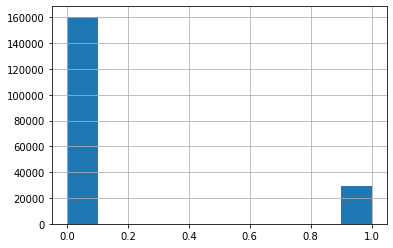

In [283]:
print(new_ds.loc[new_ds.label==1].shape[0] / new_ds.loc[new_ds.label==0].shape[0])

new_ds.label.hist()



In [285]:
# agora vamos dividir os dados em treino teste e validacao e separar a variavel alvo

new_ds_train, new_ds_test = model_selection.train_test_split(new_ds, test_size=0.3)
new_ds_test, new_ds_val = model_selection.train_test_split(new_ds_test, test_size=0.3)

y_train = new_ds_train.label.apply(lambda x: np.int8(x))
y_test = new_ds_test.label.apply(lambda x: np.int8(x))
y_val = new_ds_val.label.apply(lambda x: np.int8(x))

In [303]:
## Tf-Idf (advanced variant of BoW)

vectorizer = feature_extraction.text.TfidfVectorizer(max_features=10000, ngram_range=(1,2))

corpus = new_ds_train.text_cleaned

vectorizer.fit(corpus)
x_train = vectorizer.transform(corpus)
vocab = vectorizer.vocabulary_

In [304]:
y = y_train
x_names = vectorizer.get_feature_names_out()
p_value_limit = 0.90

dtf_features = pd.DataFrame()

for cat in np.unique(y):
    chi2, p = feature_selection.chi2(x_train, y==cat)
    dtf_features = dtf_features.append(pd.DataFrame(
                   {"feature":x_names, "score":1-p, "label":cat}))
    dtf_features = dtf_features.sort_values(["label","score"], 
                    ascending=[True,False])
    dtf_features = dtf_features[dtf_features["score"]>p_value_limit]
    
x_names = dtf_features["feature"].unique().tolist()

In [291]:
for cat in np.unique(y):
   print("# {}:".format(cat))
   print("  . selected features:",
         len(dtf_features[dtf_features["y"]==cat]))
   print("  . top features:", ",".join(
dtf_features[dtf_features["y"]==cat]["feature"].values[-10:]))
   print(" ")

# 0:
  . selected features: 1793
  . top features: apelação,cristiane brasil,prestes,sarah,gilmar mendes,primata,inteiro,suposto,pedir,cachorro
 
# 1:
  . selected features: 1793
  . top features: apelação,cristiane brasil,prestes,sarah,gilmar mendes,primata,inteiro,suposto,pedir,cachorro
 


In [308]:
# Podemos retreinar o vetorizador com o corpus do documento após a selecao dos melhores atributos.
# esta saida ira produzir a matriz e o vocabulario menos denso

vectorizer = feature_extraction.text.TfidfVectorizer(vocabulary=x_names)

vectorizer.fit(corpus)
dic_vocabulary = vectorizer.vocabulary_

In [310]:
raw_train_ds = tf.data.Dataset.from_tensor_slices((new_ds_train.text_cleaned.values, y_train.values))
raw_test_ds = tf.data.Dataset.from_tensor_slices((new_ds_test.text_cleaned.values, y_test.values))
raw_val_ds = tf.data.Dataset.from_tensor_slices((new_ds_val.text_cleaned.values, y_val.values))

raw_train_ds = raw_train_ds.batch(batch_size)
raw_test_ds = raw_test_ds.batch(batch_size)
raw_val_ds = raw_val_ds.batch(batch_size)


AUTOTUNE = tf.data.AUTOTUNE

def configure_dataset(dataset):
  return dataset.cache().prefetch(buffer_size=AUTOTUNE)

train_ds = configure_dataset(raw_train_ds)
test_ds = configure_dataset(raw_test_ds)
raw_ds = configure_dataset(raw_val_ds)

In [311]:
# encoding all datasets

train_ds = raw_train_ds.map(vectorize_text)
test_ds = raw_test_ds.map(vectorize_text)

Epoch 1/10
4142/4142 [==============================] - 12s 3ms/step - loss: 0.3872 - accuracy: 0.8550 - val_loss: 0.3791 - val_accuracy: 0.8557
Epoch 2/10
4142/4142 [==============================] - 12s 3ms/step - loss: 0.3757 - accuracy: 0.8565 - val_loss: 0.3796 - val_accuracy: 0.8557
Epoch 3/10
4142/4142 [==============================] - 12s 3ms/step - loss: 0.3757 - accuracy: 0.8564 - val_loss: 0.3797 - val_accuracy: 0.8557
Epoch 4/10
4142/4142 [==============================] - 13s 3ms/step - loss: 0.3757 - accuracy: 0.8565 - val_loss: 0.3798 - val_accuracy: 0.8556
Epoch 5/10
4142/4142 [==============================] - 12s 3ms/step - loss: 0.3757 - accuracy: 0.8565 - val_loss: 0.3798 - val_accuracy: 0.8556
Epoch 6/10
4142/4142 [==============================] - 12s 3ms/step - loss: 0.3757 - accuracy: 0.8565 - val_loss: 0.3798 - val_accuracy: 0.8556
Epoch 7/10
4142/4142 [==============================] - 12s 3ms/step - loss: 0.3757 - accuracy: 0.8565 - val_loss: 0.3798 - val_ac

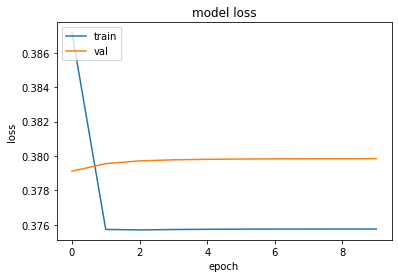

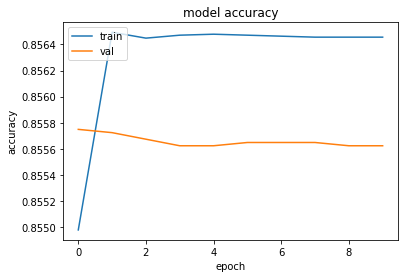

In [312]:
from tensorflow.keras import layers
from tensorflow.keras import losses

del linear_model
linear_model = tf.keras.Sequential([layers.Dense(2)])

linear_model.compile(
    loss=losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer='adam',
    metrics=['accuracy'])

history = linear_model.fit(
    train_ds, validation_data=test_ds, epochs=10)

plot_loss(history)
plot_accuracy(history)

In [313]:
loss, accuracy = linear_model.evaluate(test_ds)

print("Binary model accuracy: {:2.2%}".format(accuracy))
print("Binary model loss: {:2.2%}".format(loss))

1243/1243 [==============================] - 3s 2ms/step - loss: 0.3798 - accuracy: 0.8556
Binary model accuracy: 85.56%
Binary model loss: 37.98%


In [317]:
## encode y
dic_y_mapping = {n:label for n,label in 
                 enumerate(np.unique(y_train))}
inverse_dic = {v:k for k,v in dic_y_mapping.items()}
y_train = np.array([inverse_dic[y] for y in y_train])

## test
predicted_prob = linear_model.predict(test_ds)
predicted = [dic_y_mapping[np.argmax(pred)] for pred in 
             predicted_prob]

Pelo que podemos ver, essa abordagem não gerou resultados melhores do que o modelo linear treinado com o texto completo.